## Introduction

ESPCN (Efficient Sub-Pixel CNN), proposed by [Shi, 2016](https://arxiv.org/abs/1609.05158)
is a model that reconstructs a high-resolution version of an image given a low-resolution version.
It leverages efficient "sub-pixel convolution" layers, which learns an array of
image upscaling filters.

In this code example, we will implement the model from the paper and train it on a small dataset,
[BSDS500](https://www2.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/resources.html).

## Setup

In [1]:
import tensorflow as tf

import os
import math
import numpy as np

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.utils import load_img
from tensorflow.keras.utils import array_to_img
from tensorflow.keras.utils import img_to_array
from tensorflow.keras.preprocessing import image_dataset_from_directory

from IPython.display import display

## Load data: BSDS500 dataset

### Download dataset

We use the built-in `keras.utils.get_file` utility to retrieve the dataset.

In [2]:
dataset_url = "http://www.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz"
data_dir = keras.utils.get_file(origin=dataset_url, fname="BSR", untar=True)
root_dir = os.path.join(data_dir, "BSDS500/data")

70763455/70763455 [==============================] - 5s 0us/step


We create training and validation datasets via `image_dataset_from_directory`.

In [3]:
crop_size = 300
upscale_factor = 3
input_size = crop_size // upscale_factor
batch_size = 8

train_ds = image_dataset_from_directory(
    root_dir,
    batch_size=batch_size,
    image_size=(crop_size, crop_size),
    validation_split=0.2,
    subset="training",
    seed=1337,
    label_mode=None,
)

valid_ds = image_dataset_from_directory(
    root_dir,
    batch_size=batch_size,
    image_size=(crop_size, crop_size),
    validation_split=0.2,
    subset="validation",
    seed=1337,
    label_mode=None,
)

Found 500 files belonging to 1 classes.
Using 400 files for training.
Found 500 files belonging to 1 classes.
Using 100 files for validation.


We rescale the images to take values in the range [0, 1].

In [4]:

def scaling(input_image):
    input_image = input_image / 255.0
    return input_image


# Scale from (0, 255) to (0, 1)
train_ds = train_ds.map(scaling)
valid_ds = valid_ds.map(scaling)

Let's visualize a few sample images:

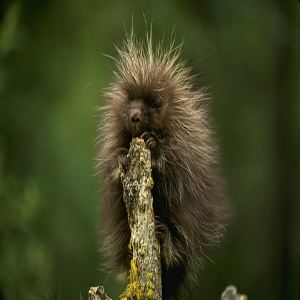

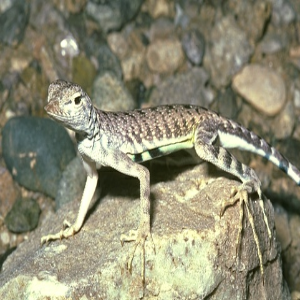

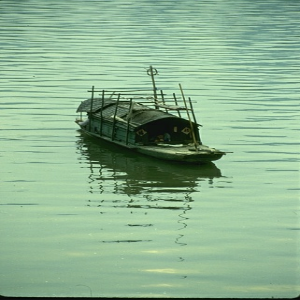

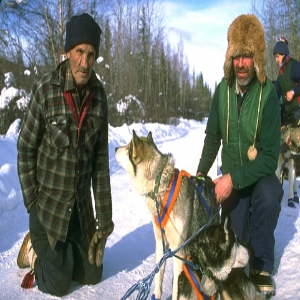

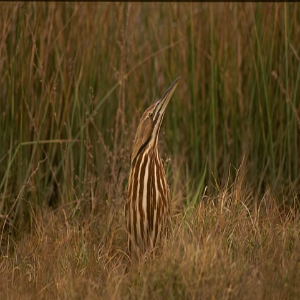

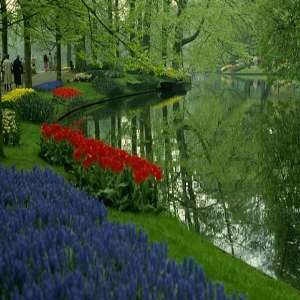

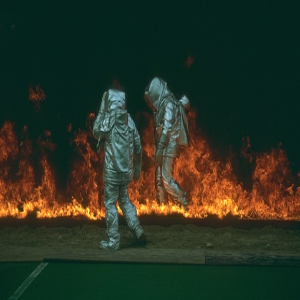

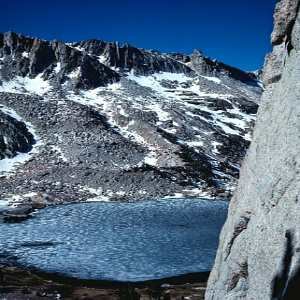

In [5]:
for batch in train_ds.take(1):
    for img in batch:
        display(array_to_img(img))

We prepare a dataset of test image paths that we will use for
visual evaluation at the end of this example.

In [6]:
dataset = os.path.join(root_dir, "images")
test_path = os.path.join(dataset, "test")

test_img_paths = sorted(
    [
        os.path.join(test_path, fname)
        for fname in os.listdir(test_path)
        if fname.endswith(".jpg")
    ]
)

## Crop and resize images

Let's process image data.
First, we convert our images from the RGB color space to the
[YUV colour space](https://en.wikipedia.org/wiki/YUV).

For the input data (low-resolution images),
we crop the image, retrieve the `y` channel (luninance),
and resize it with the `area` method (use `BICUBIC` if you use PIL).
We only consider the luminance channel
in the YUV color space because humans are more sensitive to
luminance change.

For the target data (high-resolution images), we just crop the image
and retrieve the `y` channel.

In [7]:

# Use TF Ops to process.
def process_input(input, input_size, upscale_factor):
    input = tf.image.rgb_to_yuv(input)
    last_dimension_axis = len(input.shape) - 1
    y, u, v = tf.split(input, 3, axis=last_dimension_axis)
    return tf.image.resize(y, [input_size, input_size], method="area")


def process_target(input):
    input = tf.image.rgb_to_yuv(input)
    last_dimension_axis = len(input.shape) - 1
    y, u, v = tf.split(input, 3, axis=last_dimension_axis)
    return y


train_ds = train_ds.map(
    lambda x: (process_input(x, input_size, upscale_factor), process_target(x))
)
train_ds = train_ds.prefetch(buffer_size=32)

valid_ds = valid_ds.map(
    lambda x: (process_input(x, input_size, upscale_factor), process_target(x))
)
valid_ds = valid_ds.prefetch(buffer_size=32)

Let's take a look at the input and target data.

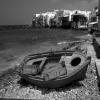

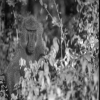

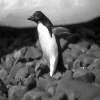

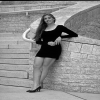

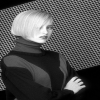

...

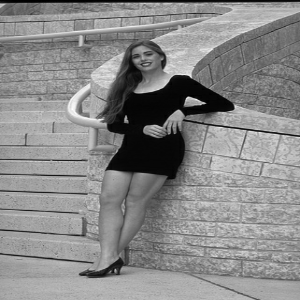

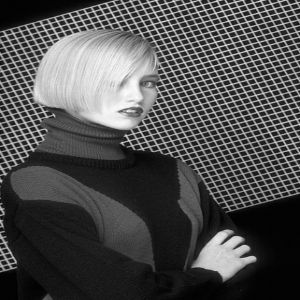

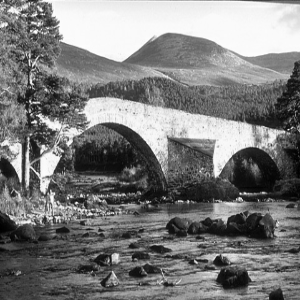

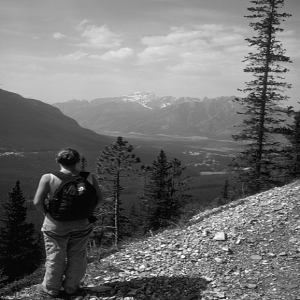

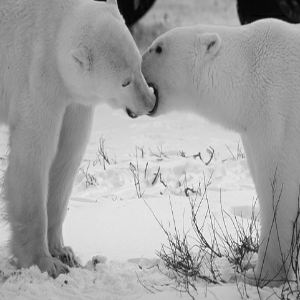

In [8]:
for batch in train_ds.take(1):
    for img in batch[0]:
        display(array_to_img(img))
    for img in batch[1]:
        display(array_to_img(img))

## Build a model

Compared to the paper, we add one more layer and we use the `relu` activation function
instead of `tanh`.
It achieves better performance even though we train the model for fewer epochs.

In [9]:

def get_model(upscale_factor=3, channels=1):
    conv_args = {
        "activation": "relu",
        "kernel_initializer": "Orthogonal",
        "padding": "same",
    }
    inputs = keras.Input(shape=(None, None, channels))
    x = layers.Conv2D(64, 5, **conv_args)(inputs)
    x = layers.Conv2D(64, 3, **conv_args)(x)
    x = layers.Conv2D(32, 3, **conv_args)(x)
    x = layers.Conv2D(channels * (upscale_factor ** 2), 3, **conv_args)(x)
    outputs = tf.nn.depth_to_space(x, upscale_factor)

    return keras.Model(inputs, outputs)


## Define utility functions

We need to define several utility functions to monitor our results:

- `plot_results` to plot an save an image.
- `get_lowres_image` to convert an image to its low-resolution version.
- `upscale_image` to turn a low-resolution image to
a high-resolution version reconstructed by the model.
In this function, we use the `y` channel from the YUV color space
as input to the model and then combine the output with the
other channels to obtain an RGB image.

In [10]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
import PIL


def plot_results(img, prefix, title):
    """Plot the result with zoom-in area."""
    img_array = img_to_array(img)
    img_array = img_array.astype("float32") / 255.0

    # Create a new figure with a default 111 subplot.
    fig, ax = plt.subplots()
    im = ax.imshow(img_array[::-1], origin="lower")

    plt.title(title)
    # zoom-factor: 2.0, location: upper-left
    axins = zoomed_inset_axes(ax, 2, loc=2)
    axins.imshow(img_array[::-1], origin="lower")

    # Specify the limits.
    x1, x2, y1, y2 = 200, 300, 100, 200
    # Apply the x-limits.
    axins.set_xlim(x1, x2)
    # Apply the y-limits.
    axins.set_ylim(y1, y2)

    plt.yticks(visible=False)
    plt.xticks(visible=False)

    # Make the line.
    mark_inset(ax, axins, loc1=1, loc2=3, fc="none", ec="blue")
    plt.savefig(str(prefix) + "-" + title + ".png")
    plt.show()


def get_lowres_image(img, upscale_factor):
    """Return low-resolution image to use as model input."""
    return img.resize(
        (img.size[0] // upscale_factor, img.size[1] // upscale_factor),
        PIL.Image.BICUBIC,
    )


def upscale_image(model, img):
    """Predict the result based on input image and restore the image as RGB."""
    ycbcr = img.convert("YCbCr")
    y, cb, cr = ycbcr.split()
    y = img_to_array(y)
    y = y.astype("float32") / 255.0

    input = np.expand_dims(y, axis=0)
    out = model.predict(input)

    out_img_y = out[0]
    out_img_y *= 255.0

    # Restore the image in RGB color space.
    out_img_y = out_img_y.clip(0, 255)
    out_img_y = out_img_y.reshape((np.shape(out_img_y)[0], np.shape(out_img_y)[1]))
    out_img_y = PIL.Image.fromarray(np.uint8(out_img_y), mode="L")
    out_img_cb = cb.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img_cr = cr.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img = PIL.Image.merge("YCbCr", (out_img_y, out_img_cb, out_img_cr)).convert(
        "RGB"
    )
    return out_img


## Define callbacks to monitor training

The `ESPCNCallback` object will compute and display
the [PSNR](https://en.wikipedia.org/wiki/Peak_signal-to-noise_ratio) metric.
This is the main metric we use to evaluate super-resolution performance.

In [11]:

class ESPCNCallback(keras.callbacks.Callback):
    def __init__(self):
        super().__init__()
        self.test_img = get_lowres_image(load_img(test_img_paths[0]), upscale_factor)

    # Store PSNR value in each epoch.
    def on_epoch_begin(self, epoch, logs=None):
        self.psnr = []

    def on_epoch_end(self, epoch, logs=None):
        print("Mean PSNR for epoch: %.2f" % (np.mean(self.psnr)))
        if epoch % 20 == 0:
            prediction = upscale_image(self.model, self.test_img)
            plot_results(prediction, "epoch-" + str(epoch), "prediction")

    def on_test_batch_end(self, batch, logs=None):
        self.psnr.append(10 * math.log10(1 / logs["loss"]))


Define `ModelCheckpoint` and `EarlyStopping` callbacks.

In [12]:
early_stopping_callback = keras.callbacks.EarlyStopping(monitor="loss", patience=10)

checkpoint_filepath = "/tmp/checkpoint"

model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor="loss",
    mode="min",
    save_best_only=True,
)

model = get_model(upscale_factor=upscale_factor, channels=1)
model.summary()

callbacks = [ESPCNCallback(), early_stopping_callback, model_checkpoint_callback]
loss_fn = keras.losses.MeanSquaredError()
optimizer = keras.optimizers.Adam(learning_rate=0.001)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, None, 1)]   0         
                                                                 
 conv2d (Conv2D)             (None, None, None, 64)    1664      
                                                                 
 conv2d_1 (Conv2D)           (None, None, None, 64)    36928     
                                                                 
 conv2d_2 (Conv2D)           (None, None, None, 32)    18464     
                                                                 
 conv2d_3 (Conv2D)           (None, None, None, 9)     2601      
                                                                 
 tf.nn.depth_to_space (TFOpL  (None, None, None, 1)    0         
 ambda)                                                          
                                                             

## Train the model

Epoch 1/100
Mean PSNR for epoch: 22.73
1/1 [==============================] - 0s 306ms/step


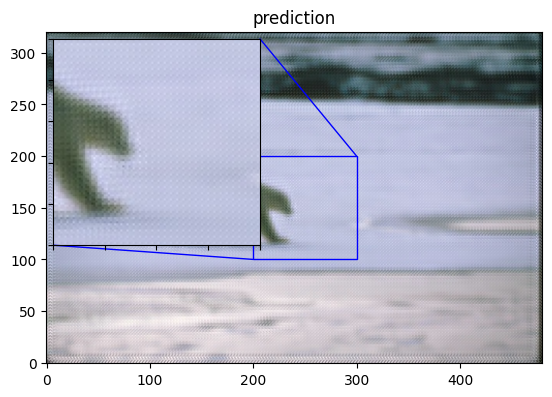

50/50 - 14s - loss: 0.0229 - val_loss: 0.0054 - 14s/epoch - 286ms/step
Epoch 2/100
Mean PSNR for epoch: 24.77
50/50 - 2s - loss: 0.0046 - val_loss: 0.0032 - 2s/epoch - 37ms/step
Epoch 3/100
Mean PSNR for epoch: 25.59
50/50 - 2s - loss: 0.0034 - val_loss: 0.0029 - 2s/epoch - 44ms/step
Epoch 4/100
Mean PSNR for epoch: 26.28
50/50 - 2s - loss: 0.0031 - val_loss: 0.0026 - 2s/epoch - 43ms/step
Epoch 5/100
Mean PSNR for epoch: 25.80
50/50 - 3s - loss: 0.0029 - val_loss: 0.0027 - 3s/epoch - 57ms/step
Epoch 6/100
Mean PSNR for epoch: 25.98
50/50 - 2s - loss: 0.0031 - val_loss: 0.0027 - 2s/epoch - 38ms/step
Epoch 7/100
Mean PSNR for epoch: 26.25
50/50 - 2s - loss: 0.0028 - val_loss: 0.0025 - 2s/epoch - 37ms/step
Epoch 8/100
Mean PSNR for epoch: 26.23
50/50 - 2s - loss: 0.0028 - val_loss: 0.0025 - 2s/epoch - 45ms/step
Epoch 9/100
Mean PSNR for epoch: 26.18
50/50 - 3s - loss: 0.0028 - val_loss: 0.0026 - 3s/epoch - 63ms/step
Epoch 10/100
Mean PSNR for epoch: 26.20
50/50 - 2s - loss: 0.0028 - val_l

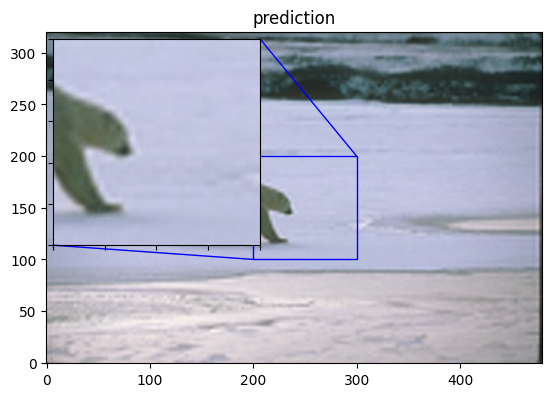

50/50 - 3s - loss: 0.0027 - val_loss: 0.0024 - 3s/epoch - 52ms/step
Epoch 22/100
Mean PSNR for epoch: 26.19
50/50 - 2s - loss: 0.0027 - val_loss: 0.0024 - 2s/epoch - 42ms/step
Epoch 23/100
Mean PSNR for epoch: 26.57
50/50 - 2s - loss: 0.0027 - val_loss: 0.0024 - 2s/epoch - 38ms/step
Epoch 24/100
Mean PSNR for epoch: 26.51
50/50 - 2s - loss: 0.0027 - val_loss: 0.0024 - 2s/epoch - 46ms/step
Epoch 25/100
Mean PSNR for epoch: 26.99
50/50 - 3s - loss: 0.0027 - val_loss: 0.0023 - 3s/epoch - 54ms/step
Epoch 26/100
Mean PSNR for epoch: 26.26
50/50 - 2s - loss: 0.0026 - val_loss: 0.0023 - 2s/epoch - 36ms/step
Epoch 27/100
Mean PSNR for epoch: 27.15
50/50 - 2s - loss: 0.0026 - val_loss: 0.0023 - 2s/epoch - 42ms/step
Epoch 28/100
Mean PSNR for epoch: 26.47
50/50 - 2s - loss: 0.0026 - val_loss: 0.0024 - 2s/epoch - 35ms/step
Epoch 29/100
Mean PSNR for epoch: 26.57
50/50 - 2s - loss: 0.0026 - val_loss: 0.0023 - 2s/epoch - 44ms/step
Epoch 30/100
Mean PSNR for epoch: 26.38
50/50 - 2s - loss: 0.0026 - 

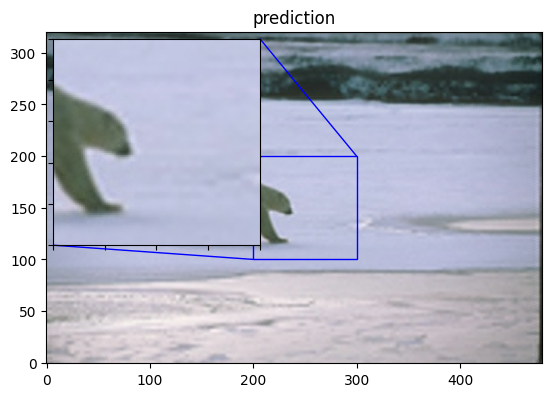

50/50 - 3s - loss: 0.0026 - val_loss: 0.0023 - 3s/epoch - 53ms/step
Epoch 42/100
Mean PSNR for epoch: 26.66
50/50 - 2s - loss: 0.0026 - val_loss: 0.0023 - 2s/epoch - 46ms/step
Epoch 43/100
Mean PSNR for epoch: 26.80
50/50 - 3s - loss: 0.0026 - val_loss: 0.0023 - 3s/epoch - 51ms/step
Epoch 44/100
Mean PSNR for epoch: 26.81
50/50 - 2s - loss: 0.0026 - val_loss: 0.0023 - 2s/epoch - 36ms/step
Epoch 45/100
Mean PSNR for epoch: 26.43
50/50 - 2s - loss: 0.0026 - val_loss: 0.0023 - 2s/epoch - 37ms/step
Epoch 46/100
Mean PSNR for epoch: 26.23
50/50 - 2s - loss: 0.0026 - val_loss: 0.0023 - 2s/epoch - 43ms/step
Epoch 47/100
Mean PSNR for epoch: 26.54
50/50 - 2s - loss: 0.0026 - val_loss: 0.0023 - 2s/epoch - 43ms/step
Epoch 48/100
Mean PSNR for epoch: 26.31
50/50 - 3s - loss: 0.0026 - val_loss: 0.0023 - 3s/epoch - 59ms/step
Epoch 49/100
Mean PSNR for epoch: 26.48
50/50 - 2s - loss: 0.0026 - val_loss: 0.0023 - 2s/epoch - 37ms/step
Epoch 50/100
Mean PSNR for epoch: 26.38
50/50 - 2s - loss: 0.0025 - 

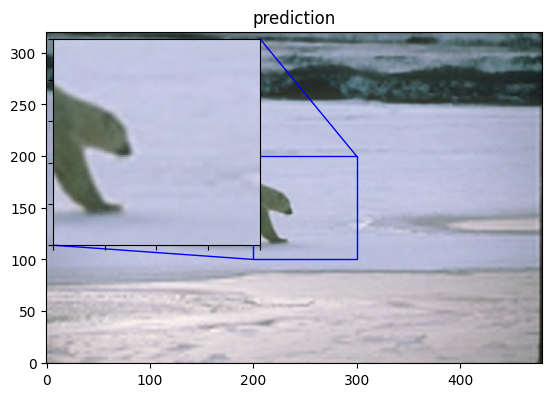

50/50 - 3s - loss: 0.0026 - val_loss: 0.0023 - 3s/epoch - 52ms/step
Epoch 62/100
Mean PSNR for epoch: 26.23
50/50 - 3s - loss: 0.0025 - val_loss: 0.0023 - 3s/epoch - 51ms/step
Epoch 63/100
Mean PSNR for epoch: 26.34
50/50 - 2s - loss: 0.0025 - val_loss: 0.0023 - 2s/epoch - 45ms/step
Epoch 64/100
Mean PSNR for epoch: 27.31
50/50 - 2s - loss: 0.0025 - val_loss: 0.0023 - 2s/epoch - 41ms/step
Epoch 65/100
Mean PSNR for epoch: 26.86
50/50 - 2s - loss: 0.0025 - val_loss: 0.0023 - 2s/epoch - 37ms/step
Epoch 66/100
Mean PSNR for epoch: 26.36
50/50 - 3s - loss: 0.0025 - val_loss: 0.0023 - 3s/epoch - 66ms/step
Epoch 67/100
Mean PSNR for epoch: 26.66
50/50 - 2s - loss: 0.0025 - val_loss: 0.0023 - 2s/epoch - 37ms/step
Epoch 68/100
Mean PSNR for epoch: 26.66
50/50 - 3s - loss: 0.0025 - val_loss: 0.0023 - 3s/epoch - 50ms/step
Epoch 69/100
Mean PSNR for epoch: 26.43
50/50 - 3s - loss: 0.0025 - val_loss: 0.0022 - 3s/epoch - 55ms/step
Epoch 70/100
Mean PSNR for epoch: 26.70
50/50 - 3s - loss: 0.0025 - 

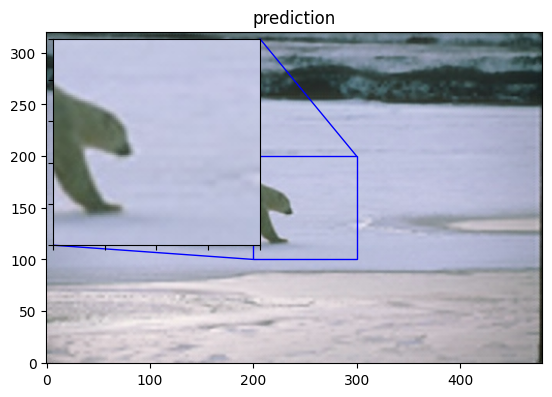

50/50 - 3s - loss: 0.0025 - val_loss: 0.0022 - 3s/epoch - 65ms/step
Epoch 82/100
Mean PSNR for epoch: 26.63
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 44ms/step
Epoch 83/100
Mean PSNR for epoch: 26.81
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 42ms/step
Epoch 84/100
Mean PSNR for epoch: 26.67
50/50 - 2s - loss: 0.0025 - val_loss: 0.0022 - 2s/epoch - 37ms/step
Epoch 85/100
Mean PSNR for epoch: 26.70
50/50 - 3s - loss: 0.0025 - val_loss: 0.0023 - 3s/epoch - 62ms/step
Epoch 86/100
Mean PSNR for epoch: 25.56
50/50 - 2s - loss: 0.0025 - val_loss: 0.0026 - 2s/epoch - 38ms/step
Epoch 87/100
Mean PSNR for epoch: 26.33
50/50 - 2s - loss: 0.0026 - val_loss: 0.0023 - 2s/epoch - 41ms/step
Epoch 88/100
Mean PSNR for epoch: 25.30
50/50 - 2s - loss: 0.0027 - val_loss: 0.0029 - 2s/epoch - 38ms/step
Epoch 89/100
Mean PSNR for epoch: 26.55
50/50 - 3s - loss: 0.0025 - val_loss: 0.0022 - 3s/epoch - 60ms/step
Epoch 90/100
Mean PSNR for epoch: 26.36
50/50 - 2s - loss: 0.0025 - 

In [13]:
epochs = 100

model.compile(
    optimizer=optimizer, loss=loss_fn,
)

model.fit(
    train_ds, epochs=epochs, callbacks=callbacks, validation_data=valid_ds, verbose=2
)

# The model weights (that are considered the best) are loaded into the model.
model.load_weights(checkpoint_filepath)

## Run model prediction and plot the results

Let's compute the reconstructed version of a few images and save the results.

1/1 [==============================] - 0s 26ms/step
PSNR of low resolution image and high resolution image is 29.8502
PSNR of predict and high resolution is 30.4488


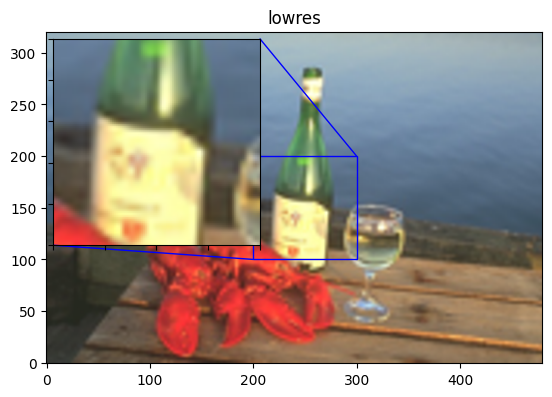

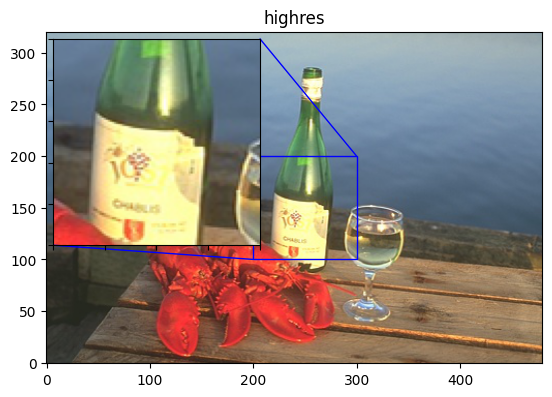

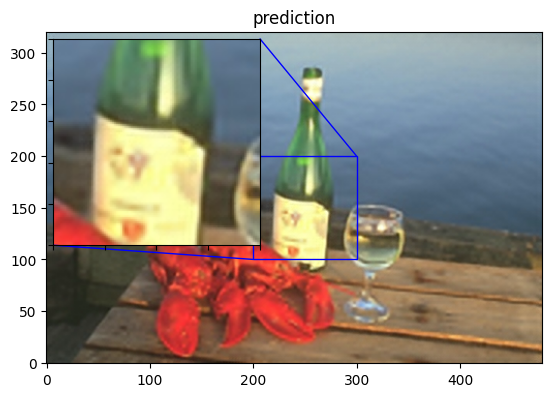

1/1 [==============================] - 0s 35ms/step
PSNR of low resolution image and high resolution image is 24.9783
PSNR of predict and high resolution is 25.9593


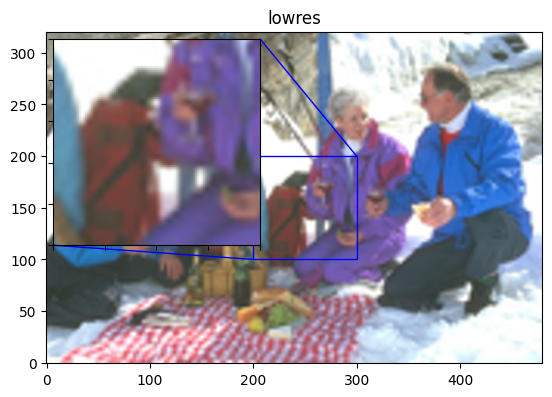

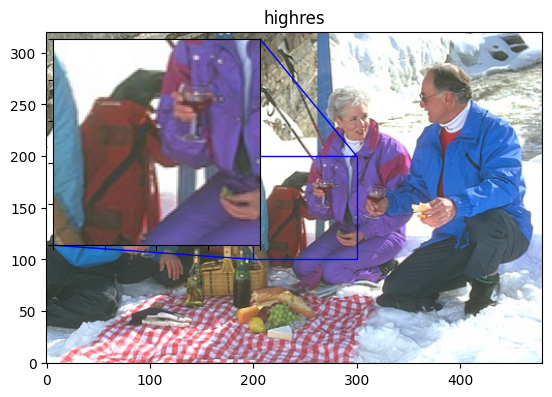

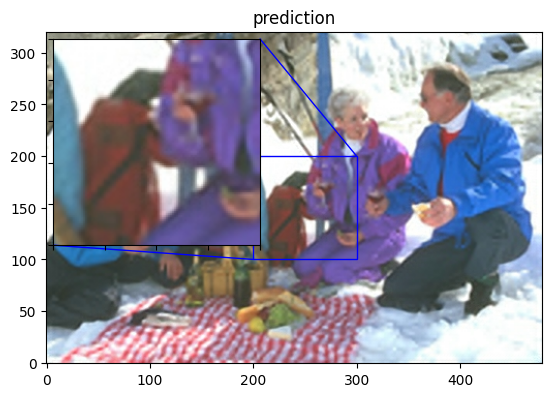

1/1 [==============================] - 0s 310ms/step
PSNR of low resolution image and high resolution image is 27.7724
PSNR of predict and high resolution is 28.4004


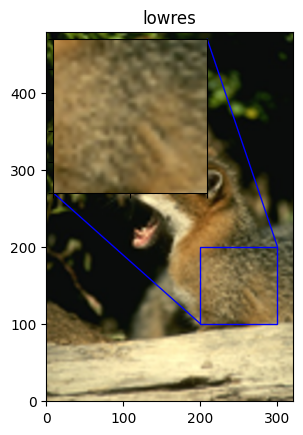

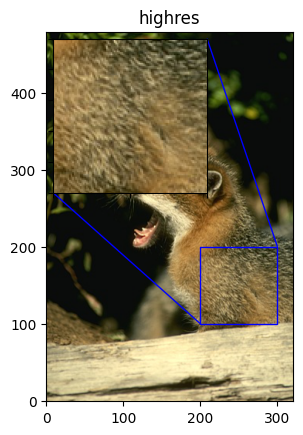

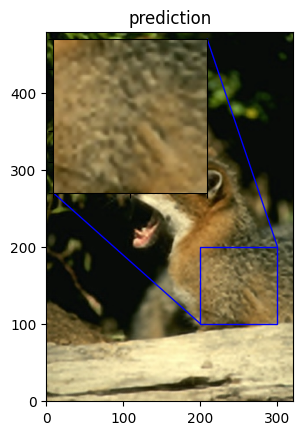

1/1 [==============================] - 0s 27ms/step
PSNR of low resolution image and high resolution image is 28.0314
PSNR of predict and high resolution is 28.2909


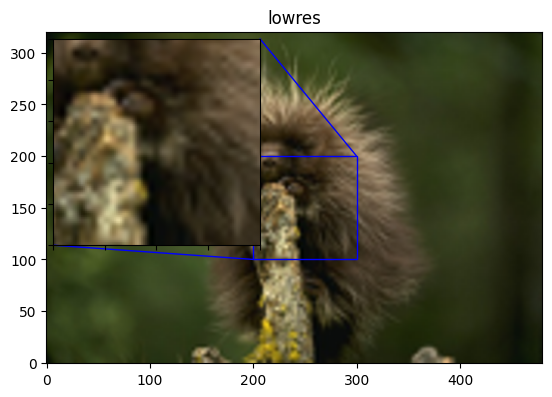

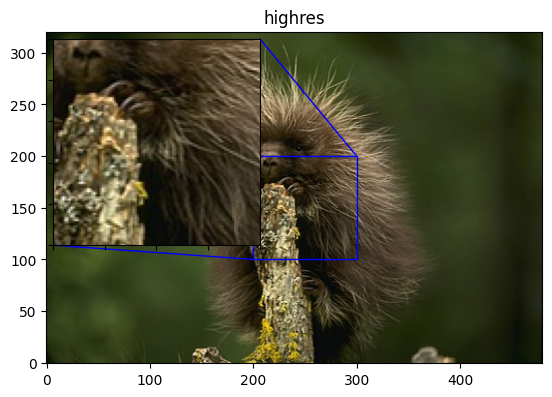

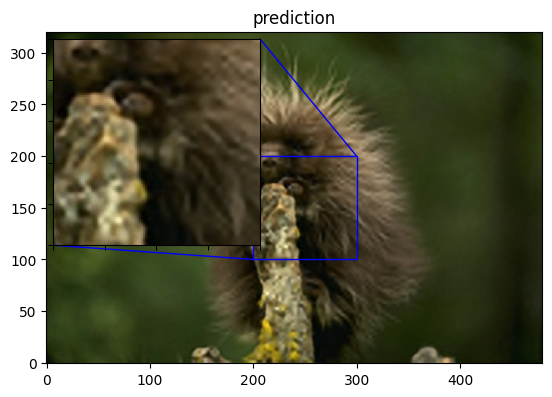

1/1 [==============================] - 0s 56ms/step
PSNR of low resolution image and high resolution image is 25.7630
PSNR of predict and high resolution is 26.3448


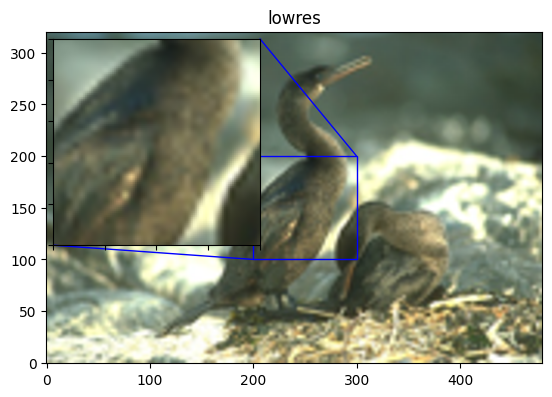

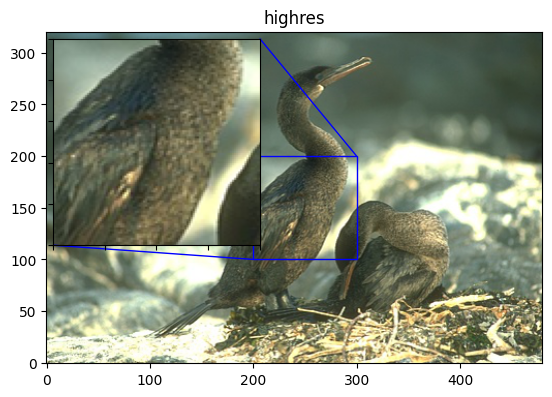

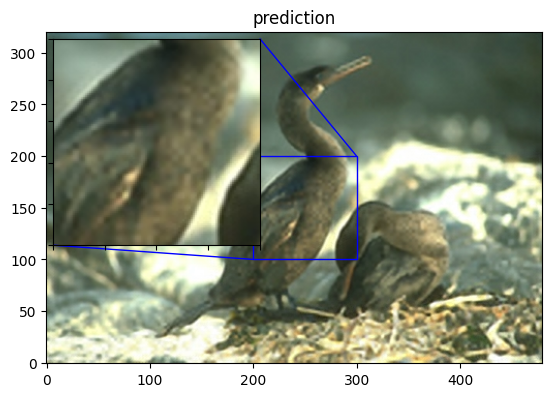

1/1 [==============================] - 0s 29ms/step
PSNR of low resolution image and high resolution image is 25.7874
PSNR of predict and high resolution is 26.5825


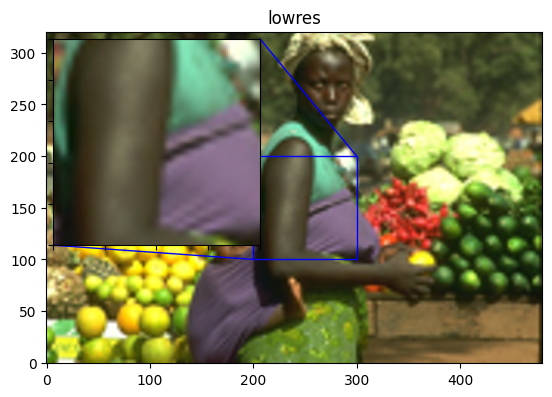

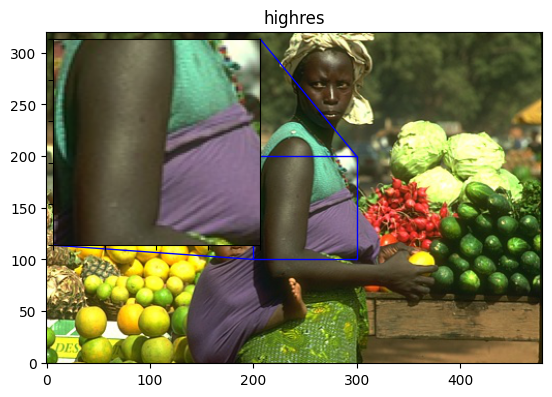

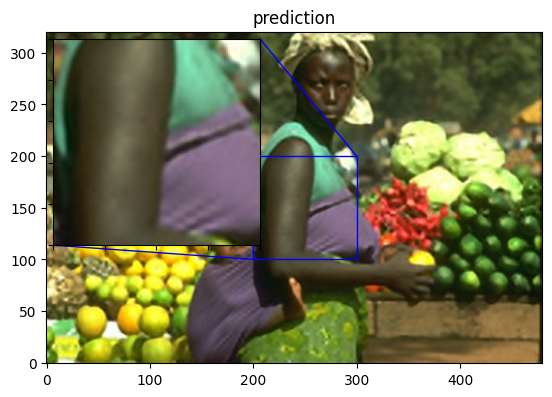

1/1 [==============================] - 0s 32ms/step
PSNR of low resolution image and high resolution image is 26.2512
PSNR of predict and high resolution is 27.1946


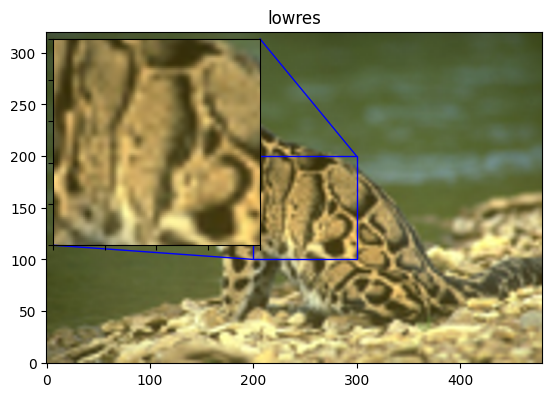

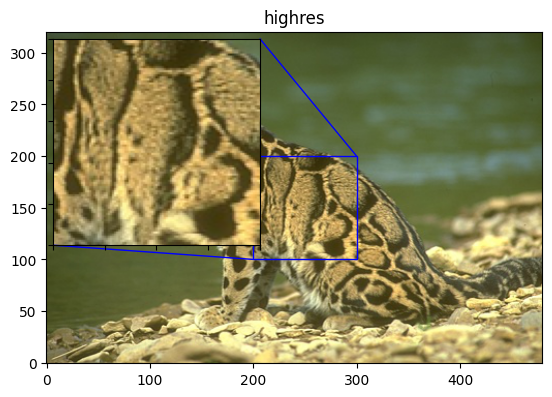

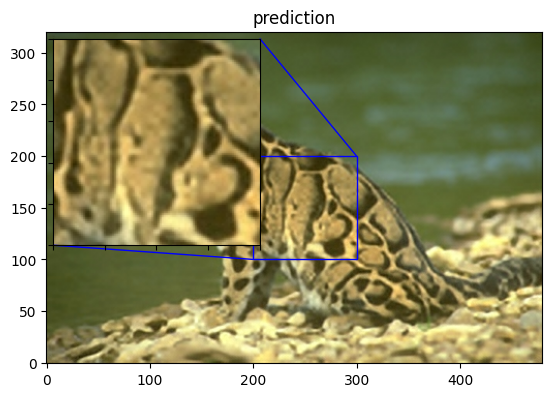

1/1 [==============================] - 0s 28ms/step
PSNR of low resolution image and high resolution image is 23.3820
PSNR of predict and high resolution is 24.6718


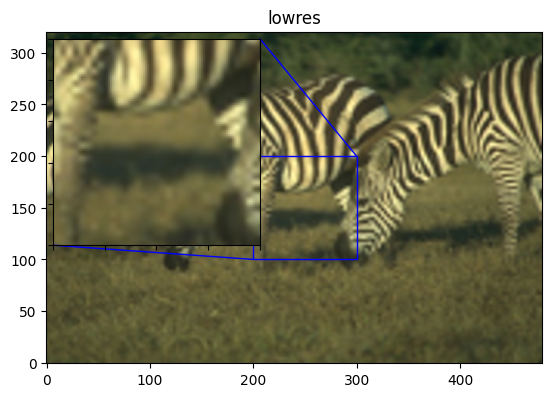

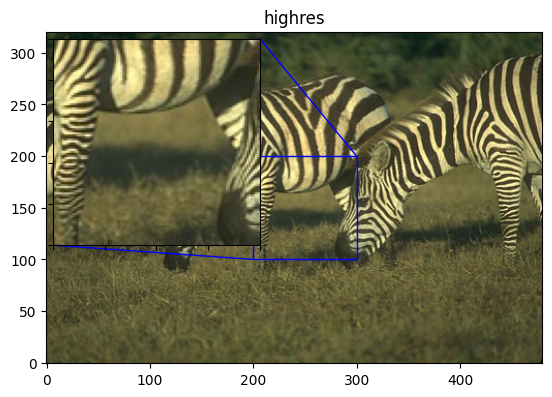

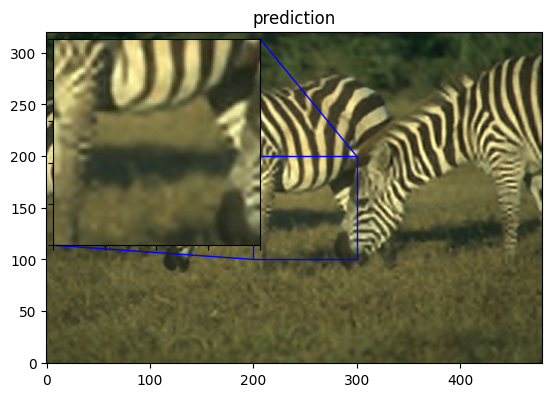

1/1 [==============================] - 0s 41ms/step
PSNR of low resolution image and high resolution image is 29.8914
PSNR of predict and high resolution is 30.1177


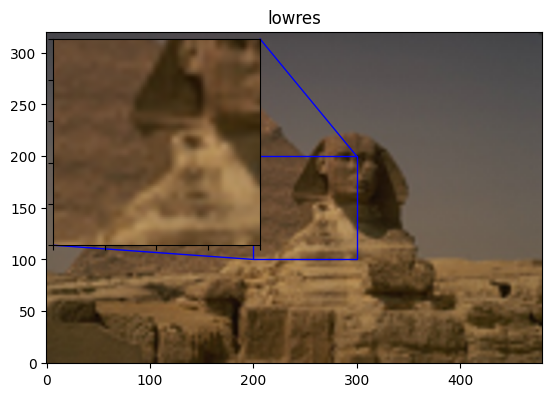

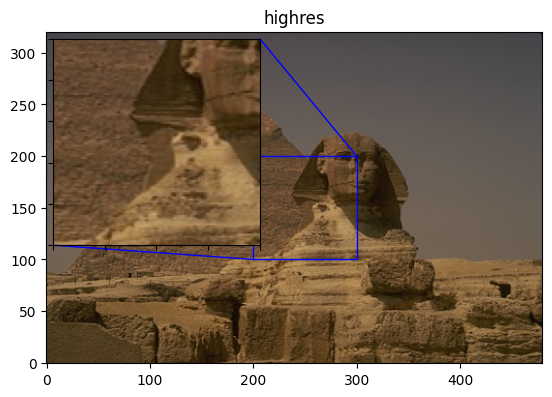

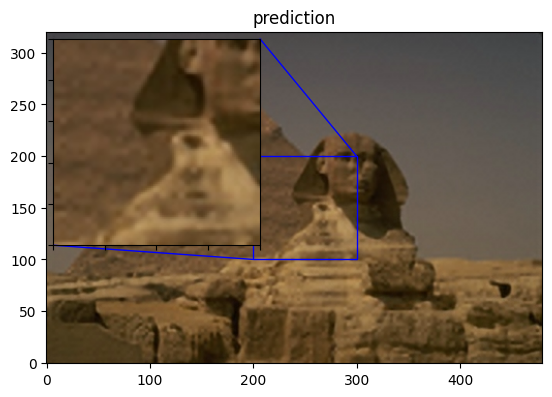

1/1 [==============================] - 0s 37ms/step
PSNR of low resolution image and high resolution image is 25.1712
PSNR of predict and high resolution is 25.7204


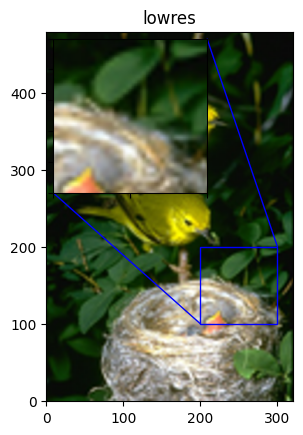

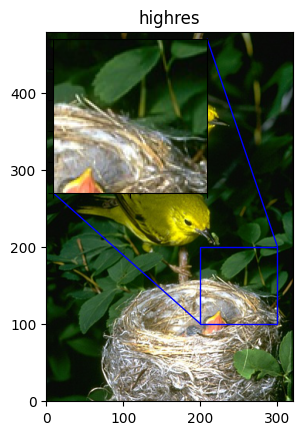

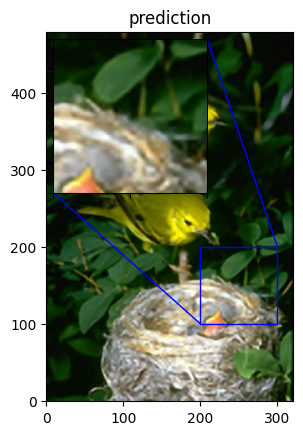

Avg. PSNR of lowres images is 26.6879
Avg. PSNR of reconstructions is 27.3731


In [14]:
total_bicubic_psnr = 0.0
total_test_psnr = 0.0

for index, test_img_path in enumerate(test_img_paths[50:60]):
    img = load_img(test_img_path)
    lowres_input = get_lowres_image(img, upscale_factor)
    w = lowres_input.size[0] * upscale_factor
    h = lowres_input.size[1] * upscale_factor
    highres_img = img.resize((w, h))
    prediction = upscale_image(model, lowres_input)
    lowres_img = lowres_input.resize((w, h))
    lowres_img_arr = img_to_array(lowres_img)
    highres_img_arr = img_to_array(highres_img)
    predict_img_arr = img_to_array(prediction)
    bicubic_psnr = tf.image.psnr(lowres_img_arr, highres_img_arr, max_val=255)
    test_psnr = tf.image.psnr(predict_img_arr, highres_img_arr, max_val=255)

    total_bicubic_psnr += bicubic_psnr
    total_test_psnr += test_psnr

    print(
        "PSNR of low resolution image and high resolution image is %.4f" % bicubic_psnr
    )
    print("PSNR of predict and high resolution is %.4f" % test_psnr)
    plot_results(lowres_img, index, "lowres")
    plot_results(highres_img, index, "highres")
    plot_results(prediction, index, "prediction")

print("Avg. PSNR of lowres images is %.4f" % (total_bicubic_psnr / 10))
print("Avg. PSNR of reconstructions is %.4f" % (total_test_psnr / 10))